<a href="https://colab.research.google.com/github/ViC3nte1/Pengolahan_Citra/blob/main/Jobsheet_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Praktikum 1 Operator Sobel

Pada operator sobel mampu menyoroti tepi dengan arah yang bervariasi karena menggunakan kernel 3x3 untuk menghitung turunan intensitas citra secara horizontal Gx dan vertical Gy

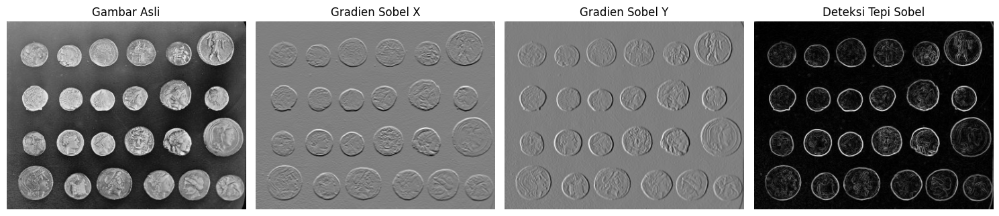

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

image = data.coins()
gray_image = color.rgb2gray(image) if image.ndim == 3 else image

sobel_x = filters.sobel_h(gray_image)
sobel_y = filters.sobel_v(gray_image)
sobel_edge = filters.sobel(gray_image)
fig, axes = plt.subplots(1, 4, figsize=(15, 5))
ax = axes.ravel()
ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title("Gambar Asli")
ax[0].axis("off")
ax[1].imshow(sobel_x, cmap='gray')
ax[1].set_title("Gradien Sobel X")
ax[1].axis("off")
ax[2].imshow(sobel_y, cmap='gray')
ax[2].set_title("Gradien Sobel Y")
ax[2].axis("off")
ax[3].imshow(sobel_edge, cmap='gray')
ax[3].set_title("Deteksi Tepi Sobel")
ax[3].axis("off")
plt.tight_layout()
plt.show()

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

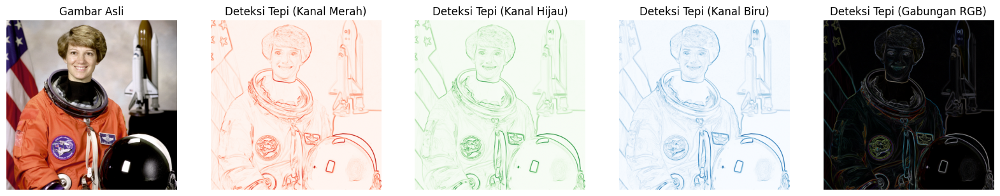

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

image = data.astronaut()

red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

sobel_red = filters.sobel(red_channel)
sobel_green = filters.sobel(green_channel)
sobel_blue = filters.sobel(blue_channel)

sobel_color = np.stack((sobel_red, sobel_green, sobel_blue), axis=2)

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
ax = axes.ravel()
ax[0].imshow(image)
ax[0].set_title("Gambar Asli")
ax[0].axis("off")
ax[1].imshow(sobel_red, cmap='Reds')
ax[1].set_title("Deteksi Tepi (Kanal Merah)")
ax[1].axis("off")
ax[2].imshow(sobel_green, cmap='Greens')
ax[2].set_title("Deteksi Tepi (Kanal Hijau)")
ax[2].axis("off")
ax[3].imshow(sobel_blue, cmap='Blues')
ax[3].set_title("Deteksi Tepi (Kanal Biru)")
ax[3].axis("off")
ax[4].imshow(sobel_color)
ax[4].set_title("Deteksi Tepi (Gabungan RGB)")
ax[4].axis("off")

###Praktikum 2 Operator Sobel

Merupakan pemrosesan citra dengan menggunakan kernel 2x2 untuk menghitung perbedaan piksel secara diagonal. Operator ini memiliki kelebihan dari sisi kecepatan komputasinya yang tinggi, namun juga memiliki kekuranggan yaitu lebih sensitif terhadao noise dibandingkan operator lain

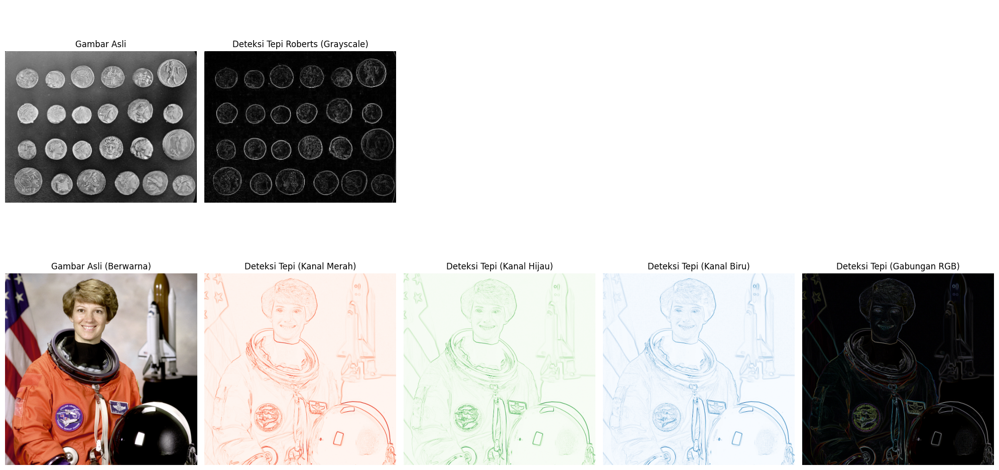

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

image_gray = data.coins()
roberts_gray = filters.roberts(image_gray)

image_color = data.astronaut()
red_channel = image_color[:, :, 0]
green_channel = image_color[:, :, 1]
blue_channel = image_color[:, :, 2]

roberts_red = filters.roberts(red_channel)
roberts_green = filters.roberts(green_channel)
roberts_blue = filters.roberts(blue_channel)

roberts_color = np.stack((roberts_red, roberts_green, roberts_blue), axis=2)

fog, axes = plt.subplots(2, 5, figsize=(20, 10))
ax = axes.ravel()

ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Gambar Asli')
ax[0].axis("off")

ax[1].imshow(roberts_gray, cmap='gray')
ax[1].set_title('Deteksi Tepi Roberts (Grayscale)')
ax[1].axis("off")

for i in range(2, 5):
  ax[i].axis("off")

ax[5].imshow(image_color)
ax[5].set_title('Gambar Asli (Berwarna)')
ax[5].axis("off")

ax[6].imshow(roberts_red, cmap='Reds')
ax[6].set_title('Deteksi Tepi (Kanal Merah)')
ax[6].axis("off")

ax[7].imshow(roberts_green, cmap='Greens')
ax[7].set_title('Deteksi Tepi (Kanal Hijau)')
ax[7].axis("off")

ax[8].imshow(roberts_blue, cmap='Blues')
ax[8].set_title('Deteksi Tepi (Kanal Biru)')
ax[8].axis("off")

ax[9].imshow(roberts_color)
ax[9].set_title('Deteksi Tepi (Gabungan RGB)')
ax[9].axis("off")

plt.tight_layout()
plt.show()

###Praktikum 3 Perbandingan Operator Citra Grayscale

Setiap operator memiliki karakteristik unik, seperti sensitivitas terhadap noise, ketebalan tepi, dan kompleksitas komputasi. Contoh pada operator Canny memnghasilkan banyak sekali garis sehingga membuat coin kurang jelas, sedangkan pada keempat operator lainnya memiliki kesamaan hasil yaitu menghasilkan garis tipis namun bentuk coin terukir jelas pada coin besar namun lemah jika coinnya kecil.

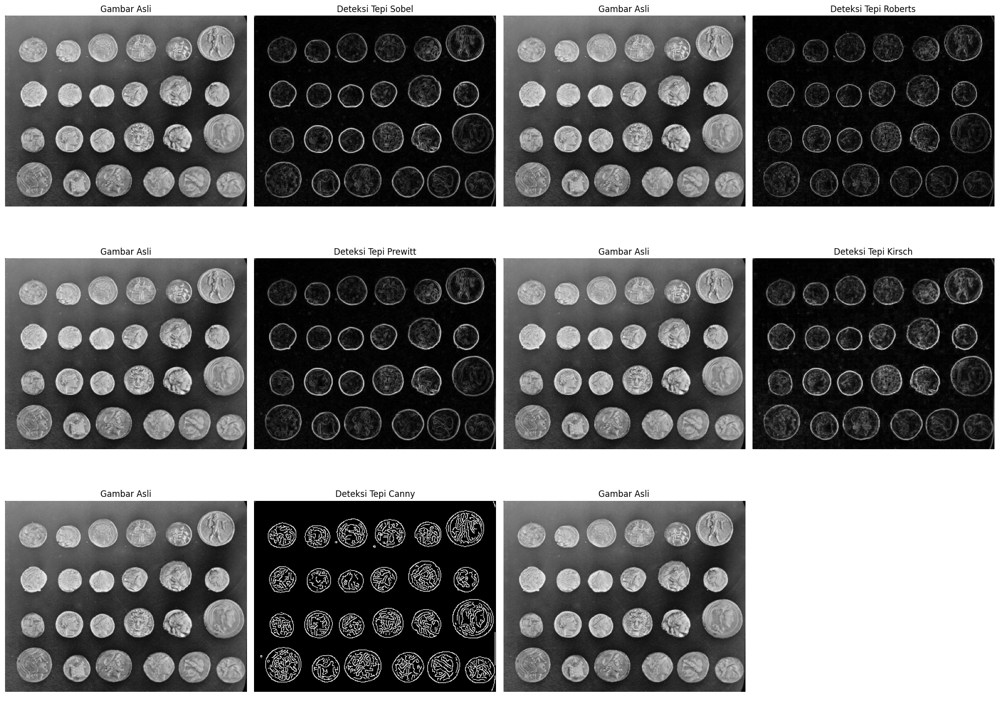

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

image_gray = data.coins()

sobel_edge = filters.sobel(image_gray)
roberts_edge = filters.roberts(image_gray)
prewitt_edge = filters.prewitt(image_gray)
kirsch_edge = gradient(image_gray, disk(1))
canny_edge = feature.canny(image_gray, sigma=1)

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

ax[0].imshow(image_gray, cmap=plt.cm.gray)
ax[0].set_title("Gambar Asli")
ax[0].axis('off')

ax[1].imshow(sobel_edge, cmap=plt.cm.gray)
ax[1].set_title("Deteksi Tepi Sobel")
ax[1].axis('off')

ax[2].imshow(image_gray, cmap='gray')
ax[2].set_title("Gambar Asli")
ax[2].axis('off')

ax[3].imshow(roberts_edge, cmap=plt.cm.gray)
ax[3].set_title("Deteksi Tepi Roberts")
ax[3].axis('off')

ax[4].imshow(image_gray, cmap='gray')
ax[4].set_title("Gambar Asli")
ax[4].axis('off')

ax[5].imshow(prewitt_edge, cmap=plt.cm.gray)
ax[5].set_title("Deteksi Tepi Prewitt")
ax[5].axis('off')

ax[6].imshow(image_gray, cmap='gray')
ax[6].set_title("Gambar Asli")
ax[6].axis('off')

ax[7].imshow(kirsch_edge, cmap=plt.cm.gray)
ax[7].set_title("Deteksi Tepi Kirsch")
ax[7].axis('off')

ax[8].imshow(image_gray, cmap='gray')
ax[8].set_title("Gambar Asli")
ax[8].axis('off')

ax[9].imshow(canny_edge, cmap=plt.cm.gray)
ax[9].set_title("Deteksi Tepi Canny")
ax[9].axis('off')

ax[10].imshow(image_gray, cmap='gray')
ax[10].set_title("Gambar Asli")
ax[10].axis('off')

ax[11].axis('off')

plt.tight_layout()
plt.show()

###Praktikum 4 Perbandingan Operator Citra Berwarna

Pada praktikum ini untuk gambar astornot berwana ditest menggunakan kelima operator yang menghasilkan garis yang berbeda, sedangkan untuk coin yang grayscale hasil secara signifikan sama. pada gambar berwarna, opeator canny dapat menghasilkan garis yang detail, sedangkan roberts dan prewitt kesulitan untuk menghasilkan garis yang optimal, sedangkan pada Kirsch dan Sobel hanya berbeda pada ketebalan garis yang dihasilkan.

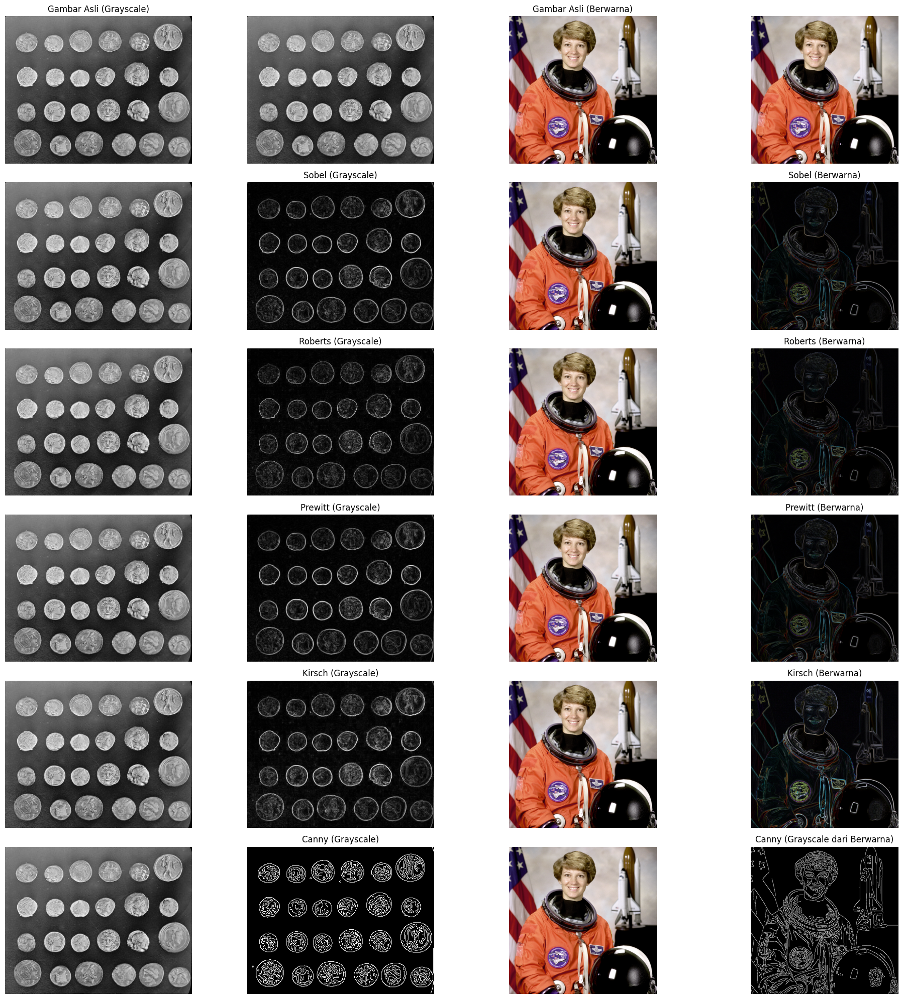

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

image_gray = data.coins()
image_color = data.astronaut()

sobel_gray = filters.sobel(image_gray)
roberts_gray = filters.roberts(image_gray)
prewitt_gray = filters.prewitt(image_gray)
kirsch_gray = gradient(image_gray, disk(1))
canny_gray = feature.canny(image_gray, sigma=1)

def apply_edge_detection(image, operator):
  red = operator(image[:, :, 0])
  green = operator(image[:, :, 1])
  blue = operator(image[:, :, 2])
  return np.stack((red, green, blue), axis = 2)

soble_color = apply_edge_detection(image_color, filters.sobel)
roberts_color = apply_edge_detection(image_color, filters.roberts)
prewitt_color = apply_edge_detection(image_color, filters.prewitt)
kirsch_color = apply_edge_detection(image_color, lambda img:gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_color), sigma=1)

fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

ax[0].imshow(image_gray, cmap=plt.cm.gray)
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis('off')

ax[1].imshow(image_gray, cmap='gray')
ax[1].axis('off')

ax[2].imshow(image_color)
ax[2].set_title("Gambar Asli (Berwarna)")
ax[2].axis('off')

ax[3].imshow(image_color)
ax[3].axis("off")

ax[4].imshow(image_gray, cmap='gray')
ax[4].axis('off')

ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title("Sobel (Grayscale)")
ax[5].axis('off')

ax[6].imshow(image_color)
ax[6].axis("off")

ax[7].imshow(soble_color)
ax[7].set_title("Sobel (Berwarna)")
ax[7].axis("off")

ax[8].imshow(image_gray, cmap='gray')
ax[8].axis('off')

ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title("Roberts (Grayscale)")
ax[9].axis('off')

ax[10].imshow(image_color)
ax[10].axis("off")

ax[11].imshow(roberts_color)
ax[11].set_title("Roberts (Berwarna)")
ax[11].axis("off")

ax[12].imshow(image_gray, cmap='gray')
ax[12].axis('off')

ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title("Prewitt (Grayscale)")
ax[13].axis('off')

ax[14].imshow(image_color)
ax[14].axis("off")

ax[15].imshow(prewitt_color)
ax[15].set_title("Prewitt (Berwarna)")
ax[15].axis("off")

ax[16].imshow(image_gray, cmap='gray')
ax[16].axis('off')

ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title("Kirsch (Grayscale)")
ax[17].axis('off')

ax[18].imshow(image_color)
ax[18].axis("off")

ax[19].imshow(kirsch_color)
ax[19].set_title("Kirsch (Berwarna)")
ax[19].axis("off")

ax[20].imshow(image_gray, cmap='gray')
ax[20].axis('off')

ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title("Canny (Grayscale)")
ax[21].axis("off")

ax[22].imshow(image_color)
ax[22].axis("off")

ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title("Canny (Grayscale dari Berwarna)")
ax[23].axis("off")

plt.tight_layout()
plt.show()

###Penugasan

Pada penugasan ini menggunakan kode program Praktikum 4 yang dimana membandingkan 5 operator untuk gambar Grayscale dan Berwarna. Untuk gambar yang digunakan yaitu gambar sebuah robot hexapod. Pada gambar Grayscale operator Canny menghasilkan garis yang terlalu banyak sehingga robot menyatu dengan garis lainnya, sedangkan untuk Prewitt, Kirsch, dan Sobel memiliki hasil yang hampir mirip namun pada Sobel menghasilkan garis yang lebih tebal, sedangkan untuk Roberts terlihat lemah karena menghasilkan garis yang tipis.

Sedangkan pada gambar Berwarna, Sobel, Roberts, dan Prewitt memiliki hasil yang hampir mirip, dan Canny sama seperti gambar Grayscale menghasilkan garis yang terlalu banyak. Sedangkan untuk Kirsch menghasilkan garis yang terbaik dan robot masih terlihat jelas.

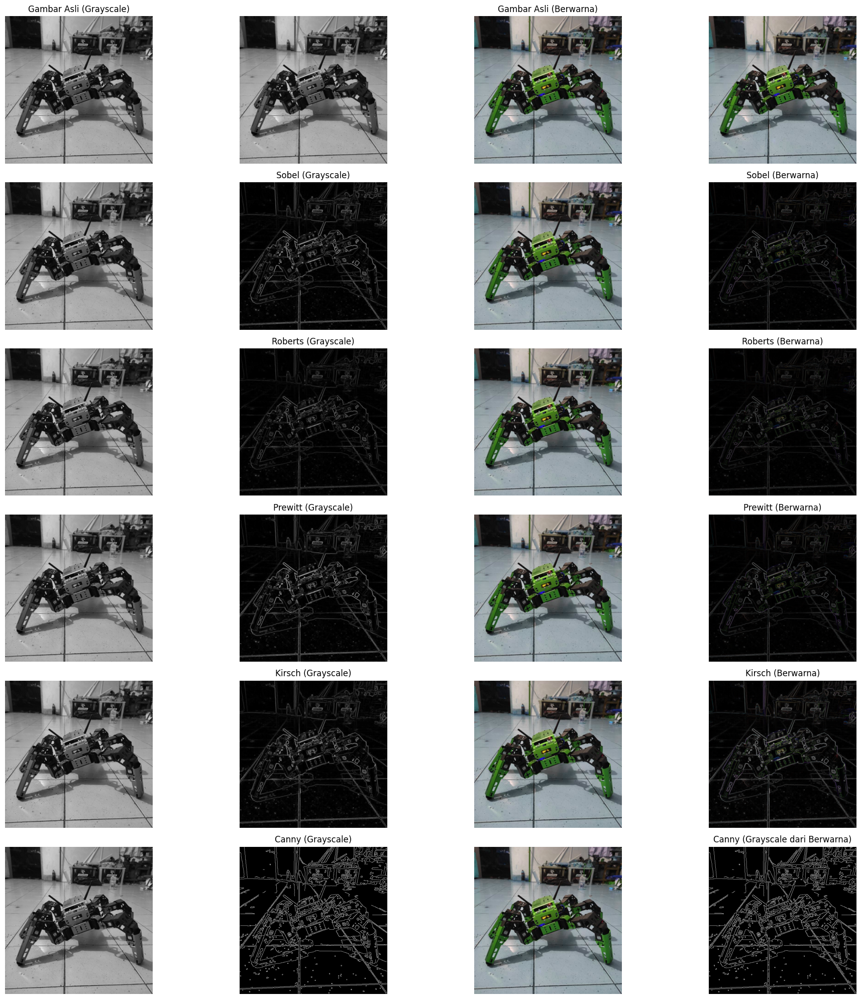

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import data, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

image_cv = cv2.imread("Gambar Robot.jpg")
gray_image = cv2.cvtColor(image_cv, cv2.COLOR_BGR2GRAY)

sobel_gray = filters.sobel(gray_image)
roberts_gray = filters.roberts(gray_image)
prewitt_gray = filters.prewitt(gray_image)
kirsch_gray = gradient(gray_image, disk(1))
canny_gray = feature.canny(gray_image, sigma=1)

def apply_edge_detection(image, operator):
  red = operator(image[:, :, 0])
  green = operator(image[:, :, 1])
  blue = operator(image[:, :, 2])
  return np.stack((red, green, blue), axis = 2)

soble_color = apply_edge_detection(image_cv, filters.sobel)
roberts_color = apply_edge_detection(image_cv, filters.roberts)
prewitt_color = apply_edge_detection(image_cv, filters.prewitt)
kirsch_color = apply_edge_detection(image_cv, lambda img:gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(image_cv), sigma=1)

fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

ax[0].imshow(gray_image, cmap=plt.cm.gray)
ax[0].set_title("Gambar Asli (Grayscale)")
ax[0].axis('off')

ax[1].imshow(gray_image, cmap='gray')
ax[1].axis('off')

ax[2].imshow(image_cv)
ax[2].set_title("Gambar Asli (Berwarna)")
ax[2].axis('off')

ax[3].imshow(image_cv)
ax[3].axis("off")

ax[4].imshow(gray_image, cmap='gray')
ax[4].axis('off')

ax[5].imshow(sobel_gray, cmap='gray')
ax[5].set_title("Sobel (Grayscale)")
ax[5].axis('off')

ax[6].imshow(image_cv)
ax[6].axis("off")

ax[7].imshow(soble_color)
ax[7].set_title("Sobel (Berwarna)")
ax[7].axis("off")

ax[8].imshow(gray_image, cmap='gray')
ax[8].axis('off')

ax[9].imshow(roberts_gray, cmap='gray')
ax[9].set_title("Roberts (Grayscale)")
ax[9].axis('off')

ax[10].imshow(image_cv)
ax[10].axis("off")

ax[11].imshow(roberts_color)
ax[11].set_title("Roberts (Berwarna)")
ax[11].axis("off")

ax[12].imshow(gray_image, cmap='gray')
ax[12].axis('off')

ax[13].imshow(prewitt_gray, cmap='gray')
ax[13].set_title("Prewitt (Grayscale)")
ax[13].axis('off')

ax[14].imshow(image_cv)
ax[14].axis("off")

ax[15].imshow(prewitt_color)
ax[15].set_title("Prewitt (Berwarna)")
ax[15].axis("off")

ax[16].imshow(gray_image, cmap='gray')
ax[16].axis('off')

ax[17].imshow(kirsch_gray, cmap='gray')
ax[17].set_title("Kirsch (Grayscale)")
ax[17].axis('off')

ax[18].imshow(image_cv)
ax[18].axis("off")

ax[19].imshow(kirsch_color)
ax[19].set_title("Kirsch (Berwarna)")
ax[19].axis("off")

ax[20].imshow(gray_image, cmap='gray')
ax[20].axis('off')

ax[21].imshow(canny_gray, cmap='gray')
ax[21].set_title("Canny (Grayscale)")
ax[21].axis("off")

ax[22].imshow(image_cv)
ax[22].axis("off")

ax[23].imshow(canny_color, cmap='gray')
ax[23].set_title("Canny (Grayscale dari Berwarna)")
ax[23].axis("off")

plt.tight_layout()
plt.show()